# 準備

In [1]:
%run ../utils-notebook/load_data.py
%run ../utils-notebook/plot.py

In [2]:
# セル1: 必要なライブラリ
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import trustworthiness
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import umap
from sklearn.datasets import fetch_openml
import plotly.express as px
import plotly.graph_objects as go

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [62]:
# mnist

data_mnist = fetch_openml('mnist_784', version=1)
n_samples = 5000
X = data_mnist.data.values[:n_samples] / 255.0
y = data_mnist.target.values[:n_samples].astype(int)


In [ ]:
# fmnist
data_fmnist = fetch_openml('Fashion-MNIST', version=1)
n_samples = 5000
X = data_fmnist.data.values[:n_samples] / 255.0
y = data_fmnist.target.values[:n_samples].astype(int)

In [ ]:
# 

# ?

In [ ]:
# ランドマーク選択（FMC）実装（Jupyter 用）
# - knn_algorithm: "sklearn" または "NNDescent"（pynndescent が必要）
# - デフォルトは論文採用値に近い n_walks=10, walk_length=10

import numpy as np
from sklearn.neighbors import NearestNeighbors

try:
    import pynndescent
    _has_pynndescent = True
except Exception:
    _has_pynndescent = False

# ---------- ユーティリティ ----------
def binary_search_sigma(dists_row, rho_i, target_k, low=1e-5, high=1000.0, tol=1e-5, max_iter=50):
    """
    単一点について sigma を二分探索で求める（UMAP の方針）
    dists_row: 近傍距離の配列 (k,)
    rho_i: 最近傍距離（dists_row[0]想定）
    target_k: 目的とする sum p = k (UMAP の式 k ~ 2 * sum p_{i|j} の近似より)
    戻り値: sigma (float)
    """
    # f(sigma) = sum(exp(-(d - rho)/sigma)) - target
    def f(sigma):
        vals = np.exp(-(dists_row - rho_i) / sigma)
        return vals.sum() - target_k

    lo, hi = low, high
    for _ in range(max_iter):
        mid = 0.5 * (lo + hi)
        val = f(mid)
        if abs(val) < tol:
            return mid
        if val > 0:
            hi = mid
        else:
            lo = mid
    return mid


# ---------- kNN取得 ----------
def compute_knn(X, k=15, knn_algorithm="sklearn", metric="euclidean", random_state=None):
    """
    X: (n_samples, n_features)
    k: 取りたい近傍数（返りは self を含めるか否かで扱いを変える）
    knn_algorithm: "sklearn" or "NNDescent"
    戻り: indices (n, k) distances (n, k)
    NOTE: returned arrays include self (distance 0 at col 0) for sklearn's kneighbors.
    """
    if knn_algorithm == "sklearn":
        nbrs = NearestNeighbors(n_neighbors=k, algorithm="auto", metric=metric).fit(X)
        dists, indices = nbrs.kneighbors(X)
        return indices, dists

    elif knn_algorithm == "NNDescent":
        if not _has_pynndescent:
            raise RuntimeError("pynndescent is not available. Install it or use knn_algorithm='sklearn'.")
        # pynndescent wants n_neighbors param; returns (indices, distances)
        index = pynndescent.NNDescent(X, n_neighbors=k, metric=metric, random_state=random_state)
        indices, dists = index.neighbor_graph
        # ensure numpy arrays
        indices = np.asarray(indices, dtype=int)
        dists = np.asarray(dists, dtype=float)
        return indices, dists

    else:
        raise ValueError("Unknown knn_algorithm: choose 'sklearn' or 'NNDescent'.")


# ---------- p_{i|j}（UMAP カーネル）計算 ----------
def compute_local_affinities(indices, dists, target_k):
    """
    indices: (n, k) 近傍インデックス（含 self を含む/除くどちらでも可だが rho uses nearest neighbor）
    dists: (n, k) 対応距離
    target_k: UMAP の式で使う k (通常は元の k)
    戻り: P (n, k) where P[i,j] = p_{i|j} (normalized unnormalized affinities)
    注意: rho_i = distance to closest neighbor (not itself). Implementation assumes dists sorted ascending.
    """
    n, k = dists.shape
    P = np.zeros_like(dists, dtype=float)
    sigmas = np.zeros(n, dtype=float)

    # if self is present and distance=0 at column 0, skip it accordingly:
    # We need rho_i = distance to closest *other* neighbor.
    # Find index of first positive distance in row:
    for i in range(n):
        row = dists[i]
        # take rho as the smallest positive distance (skip zero self-distance if present)
        # if no zero present, rho = row[0]
        rho_i = row[row > 0.0].min() if np.any(row > 0.0) else row[0]
        # binary search for sigma (UMAP: choose sigma so that sum p approximately = target_k)
        sigma = binary_search_sigma(row, rho_i, target_k)
        sigmas[i] = sigma
        # compute unnormalized p
        p = np.exp(-(row - rho_i) / sigma)
        # ensure non-negativity and zero out very small
        p = np.clip(p, 0.0, None)
        # normalize to sum 1 (so it's a probability over neighbors)
        s = p.sum()
        if s > 0:
            p = p / s
        P[i] = p
    return P, sigmas


# ---------- 遷移確率 T の構築 ----------
def build_transition_probabilities(indices, P):
    """
    indices: (n, k) neighbor indices
    P: (n, k) affinities p_{i|j} normalized (row sums to 1)
    戻り: T_indices (same as indices), T_probs (same shape) where T_probs[i] is probability distribution over indices[i]
    定義: T_{i,j} = p_{i|j} / sum_k p_{i|k}  (but P already normalized to sum 1 -> same).
    Here we keep P as T_probs for sampling.
    """
    # If P rows sum to 1 already (we normalized in compute_local_affinities), we can use P directly.
    # Return indices and probs for sampling convenience.
    return indices, P


# ---------- ランダムウォークシミュレーション ----------
def simulate_random_walks(indices, probs, n_walks=10, walk_length=10, random_state=None):
    """
    indices: (n, k) neighbors indices (int)
    probs: (n, k) sampling probs (each row sums to 1)
    For each start node s in 0..n-1:
      perform n_walks random walks of length walk_length (hops)
      at each hop, move to neighbor chosen according to probs[cur_row]
    Returns:
      visits: (n,) count of how many times each node was the endpoint
    """
    if random_state is not None:
        rng = np.random.default_rng(random_state)
    else:
        rng = np.random.default_rng()

    n, k = indices.shape
    visits = np.zeros(n, dtype=int)

    # We'll simulate sequentially per start node.
    # This is O(n * n_walks * walk_length), acceptable for moderate n (e.g., <20k) and default parameters.
    for start in range(n):
        for _ in range(n_walks):
            cur = start
            for _ in range(walk_length):
                # sample one neighbor from indices[cur] with probs[cur]
                nbrs = indices[cur]
                p = probs[cur]
                # if p sums to 0 (degenerate), pick uniformly
                if p.sum() == 0:
                    # fallback uniform
                    choice = rng.integers(0, len(nbrs))
                    cur = nbrs[choice]
                else:
                    # use choice by probabilities
                    cur = rng.choice(nbrs, p=p)
            visits[cur] += 1
    return visits


# ---------- メイン: Landmark selection ----------
def select_landmarks_fmc(X, num_landmarks, k=15, knn_algorithm="sklearn",
                         n_walks=10, walk_length=10, target_k=None, random_state=None):
    """
    X: (n_samples, n_features)
    num_landmarks: 選びたいランドマーク数 |H_i|
    k: kNN の k
    knn_algorithm: "sklearn" or "NNDescent"
    n_walks, walk_length: random-walk params (論文は n=mu=10)
    target_k: UMAP の式内で使う target (if None, use k)
    戻り: landmark_ids (array sorted by visits desc), visits (full visit counts), indices, probs
    """
    if target_k is None:
        target_k = k

    # 1) kNN
    indices, dists = compute_knn(X, k=k, knn_algorithm=knn_algorithm, random_state=random_state)
    # ensure numpy arrays
    indices = np.asarray(indices, dtype=int)
    dists = np.asarray(dists, dtype=float)

    # 2) compute p_{i|j} affinities (UMAP style) per row
    P, sigmas = compute_local_affinities(indices, dists, target_k=target_k)

    # 3) transition probabilities T (we can use P directly because we normalized rows to sum=1)
    T_indices, T_probs = build_transition_probabilities(indices, P)

    # 4) simulate random walks and count endpoint visits
    visits = simulate_random_walks(T_indices, T_probs, n_walks=n_walks, walk_length=walk_length, random_state=random_state)

    # 5) choose top visited nodes as landmarks
    order = np.argsort(-visits)
    landmark_ids = order[:num_landmarks]

    return landmark_ids, visits, T_indices, T_probs, sigmas


In [ ]:
# ダミーデータ
from sklearn.datasets import make_swiss_roll
X, _ = make_swiss_roll(n_samples=2000, noise=0.05)

# ランドマーク選択（論文準拠パラメータ）
landmarks, visits, indices, probs, sigmas = select_landmarks_fmc(
    X, num_landmarks=100, k=30, knn_algorithm="sklearn",
    n_walks=10, walk_length=10, random_state=42
)

print("top landmarks:", landmarks[:10])
print("visits stats: min,mean,max:", visits.min(), visits.mean(), visits.max())


# DBSCAN

## 準備

In [9]:
# セル1: 必要なライブラリ
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import trustworthiness
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import umap
from sklearn.datasets import fetch_openml
import plotly.express as px
import plotly.graph_objects as go

In [10]:
# セル2: データ読み込み関数 (scikit-learn版)
def load_dataset(name='mnist', n_samples=10000, random_state=0):
    if name == 'mnist':
        ds = fetch_openml("mnist_784", version=1, as_frame=False)
        X, y = ds["data"], ds["target"].astype(int)
    elif name == 'fmnist':
        ds = fetch_openml("Fashion-MNIST", version=1, as_frame=False)
        X, y = ds["data"], ds["target"].astype(int)
    else:
        raise ValueError('dataset must be mnist or fmnist')
    
    np.random.seed(random_state)
    idx = np.random.permutation(len(X))[:n_samples]
    return X[idx], y[idx]


In [11]:
# セル3: DBSCAN階層構築
def build_dbscan_hierarchy(X, eps_list, min_samples=5, metric='euclidean'):
    levels = []
    for eps in eps_list:
        db = DBSCAN(eps=eps, min_samples=min_samples, metric=metric, n_jobs=-1)
        labels = db.fit_predict(X)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        levels.append({'eps': eps, 'labels': labels, 'n_clusters': n_clusters})
        print(f'eps={eps:.4f} -> clusters={n_clusters}, noise={(labels==-1).sum()}')
    return levels

def select_landmarks_for_level(X, labels, max_landmarks=200):
    unique = [c for c in np.unique(labels) if c != -1]
    reps, rep_idx = [], []
    for c in unique:
        idx = np.where(labels == c)[0]
        if len(idx) == 0: 
            continue
        cluster_pts = X[idx]
        centroid = cluster_pts.mean(axis=0)
        d = np.linalg.norm(cluster_pts - centroid, axis=1)
        pick = idx[np.argmin(d)]
        reps.append(X[pick])
        rep_idx.append(pick)
    reps = np.array(reps)
    if reps.shape[0] > max_landmarks:
        sel = np.random.choice(reps.shape[0], max_landmarks, replace=False)
        reps = reps[sel]
        rep_idx = [rep_idx[i] for i in sel]
    return reps, rep_idx


In [ ]:
# セル4: 実験実行 & 可視化
def run_experiment(dataset='mnist', n_samples=5000, levels=5, min_samples=5, max_landmarks=200, eps_list=None):
    print('Loading dataset...')
    X, y = load_dataset(dataset, n_samples=n_samples)
    X = X / 255.0

    print('Pre-PCA to 50 dims for DBSCAN speed...')
    pca = PCA(n_components=50, random_state=0)
    X50 = pca.fit_transform(X)
    if eps_list is None:
        neigh = NearestNeighbors(n_neighbors=5).fit(X50)
        dists, _ = neigh.kneighbors(X50)
        kth = np.sort(dists[:, -1])
        eps_list = np.quantile(kth, q=np.linspace(0.05, 0.95, levels))
    print('eps_list:', np.round(eps_list,4))

    levels = build_dbscan_hierarchy(X50, eps_list, min_samples=min_samples)

    dfs = []
    for lvl in levels:
        reps, rep_idx = select_landmarks_for_level(X50, lvl['labels'], max_landmarks=max_landmarks)
        if reps.shape[0] < 2:
            continue
        try:
            reducer = umap.UMAP(n_components=2, random_state=0)
            Z = reducer.fit_transform(reps)
        except Exception as e:
            print('UMAP failed, fallback to PCA 2d:', e)
            Z = PCA(n_components=2).fit_transform(reps)
        df = pd.DataFrame(Z, columns=["x","y"])
        df["eps"] = f"eps={lvl['eps']:.3f}"
        df["rep_idx"] = rep_idx
        dfs.append(df)

    if not dfs:
        print("No embeddings to plot.")
        return

    df_all = pd.concat(dfs, ignore_index=True)

    fig = px.scatter(
        df_all, x="x", y="y",
        facet_col="eps",
        opacity=0.7,
        title=f"DBSCAN hierarchy ({dataset}, n={n_samples})"
    )
    fig.update_traces(marker=dict(size=6))
    fig.show()

    # umapとパラメータごとの色付け
    reducer = umap.UMAP(n_components=2, random_state=0)
    proj = reducer.fit_transform(X)
    df_proj = pd.DataFrame(proj, columns=["x","y"])
    
    


In [25]:
def run_experiment(dataset='mnist', n_samples=5000, eps_list=None, min_samples=5):
    import umap
    import plotly.express as px
    import pandas as pd
    from sklearn.preprocessing import MinMaxScaler
    from sklearn.decomposition import PCA
    from sklearn.cluster import DBSCAN
    from sklearn.neighbors import NearestNeighbors

    print('Loading dataset...')
    X, y = load_dataset(dataset, n_samples=n_samples)
    X = X / 255.0  # 正規化

    # --- PCA で次元削減（UMAP 前の高速化） ---
    pca = PCA(n_components=50, random_state=0)
    X50 = pca.fit_transform(X)

    # --- UMAP 埋め込み（全データに対して1回だけ） ---
    reducer = umap.UMAP(n_components=2, random_state=0)
    Z = reducer.fit_transform(X50)
    print("UMAP embedding done.")

    # --- eps_list の自動生成 ---
    if eps_list is None:
        neigh = NearestNeighbors(n_neighbors=min_samples).fit(X50)
        dists, _ = neigh.kneighbors(X50)
        kth = np.sort(dists[:, -1])
        eps_list = np.quantile(kth, q=np.linspace(0.05, 0.95, 10))  # デフォルト3段階
    print('eps_list:', np.round(eps_list,4))

    dfs = []
    for eps in eps_list:
        # DBSCAN は PCA 50 次元空間で計算
        db = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean', n_jobs=-1)
        labels = db.fit_predict(X50)
        print(f'eps={eps:.4f} -> clusters={len(set(labels)) - (1 if -1 in labels else 0)}, noise={(labels==-1).sum()}')

        df = pd.DataFrame(Z, columns=['x','y'])  # UMAP 埋め込み座標
        df['cluster'] = labels.astype(str)       # DBSCANラベルで色付け
        df['eps'] = f'eps={eps:.3f}'
        dfs.append(df)

    # --- Plotly で可視化 ---
    df_all = pd.concat(dfs, ignore_index=True)
    fig = px.scatter(
        df_all, x='x', y='y',
        color='cluster',
        facet_col='eps',
        opacity=0.7,
        title=f'UMAP embedding colored by DBSCAN clusters ({dataset}, n={n_samples})'
    )
    n_facets = len(eps_list)
    fig.update_traces(marker=dict(size=2))
    fig.update_layout(
    width=500 * n_facets,   # facet の列数に応じて幅を拡大
    height=500,             # 1行の場合の高さ
)
    fig.show()


## 実行

In [27]:
results = run_experiment(dataset='mnist', n_samples=5000, min_samples=5, eps_list=eps_list)


Loading dataset...


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



UMAP embedding done.
eps_list: [1.6666 3.1701 3.6667 4.0037 4.2913 4.5451 4.7836 5.0576 5.3814 5.938 ]
eps=1.6666 -> clusters=3, noise=4641
eps=3.1701 -> clusters=25, noise=4000
eps=3.6667 -> clusters=29, noise=3261
eps=4.0037 -> clusters=26, noise=2629
eps=4.2913 -> clusters=27, noise=2015
eps=4.5451 -> clusters=13, noise=1467
eps=4.7836 -> clusters=5, noise=1001
eps=5.0576 -> clusters=4, noise=606
eps=5.3814 -> clusters=2, noise=286
eps=5.9380 -> clusters=1, noise=68


In [26]:
# セル5: 実行例
eps_list = None # [3.0, 6.0, 9.0, 12.0, 15.0, 18.0]
# results = run_experiment(dataset='mnist', n_samples=5000, levels=20, min_samples=3, max_landmarks=200, eps_list=eps_list)
results = run_experiment(dataset='mnist', n_samples=5000, min_samples=3, eps_list=eps_list)


Loading dataset...


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



UMAP embedding done.
eps_list: [1.4515 2.8383 3.3061 3.6337 3.9222 4.1847 4.436  4.6923 5.019  5.6111]
eps=1.4515 -> clusters=19, noise=4704
eps=2.8383 -> clusters=47, noise=4118
eps=3.3061 -> clusters=73, noise=3477
eps=3.6337 -> clusters=86, noise=2887
eps=3.9222 -> clusters=77, noise=2339
eps=4.1847 -> clusters=68, noise=1814
eps=4.4360 -> clusters=41, noise=1306
eps=4.6923 -> clusters=27, noise=863
eps=5.0190 -> clusters=10, noise=475
eps=5.6111 -> clusters=2, noise=149


In [28]:
def run_experiment(dataset='mnist', n_samples=5000, eps_list=None, min_samples=5):
    import umap
    import plotly.express as px
    import pandas as pd
    from sklearn.preprocessing import MinMaxScaler
    from sklearn.decomposition import PCA
    from sklearn.cluster import DBSCAN
    from sklearn.neighbors import NearestNeighbors

    print('Loading dataset...')
    X, y = load_dataset(dataset, n_samples=n_samples)
    X = X / 255.0  # 正規化

    # --- PCA で次元削減（UMAP 前の高速化） ---
    pca = PCA(n_components=50, random_state=0)
    X50 = pca.fit_transform(X)

    # --- UMAP 埋め込み（全データに対して1回だけ） ---
    reducer = umap.UMAP(n_components=2, random_state=0)
    Z = reducer.fit_transform(X50)
    print("UMAP embedding done.")

    # --- eps_list の自動生成 ---
    if eps_list is None:
        neigh = NearestNeighbors(n_neighbors=min_samples).fit(X50)
        dists, _ = neigh.kneighbors(X50)
        kth = np.sort(dists[:, -1])
        eps_list = np.quantile(kth, q=np.linspace(0.05, 0.95, 10))  # デフォルト3段階
    print('eps_list:', np.round(eps_list,4))

    dfs = []
    for eps in eps_list:
        # DBSCAN は PCA 50 次元空間で計算
        db = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean', n_jobs=-1)
        labels = db.fit_predict(X)
        print(f'eps={eps:.4f} -> clusters={len(set(labels)) - (1 if -1 in labels else 0)}, noise={(labels==-1).sum()}')

        df = pd.DataFrame(Z, columns=['x','y'])  # UMAP 埋め込み座標
        df['cluster'] = labels.astype(str)       # DBSCANラベルで色付け
        df['eps'] = f'eps={eps:.3f}'
        dfs.append(df)

    # --- Plotly で可視化 ---
    df_all = pd.concat(dfs, ignore_index=True)
    fig = px.scatter(
        df_all, x='x', y='y',
        color='cluster',
        facet_col='eps',
        opacity=0.7,
        title=f'UMAP embedding colored by DBSCAN clusters ({dataset}, n={n_samples})'
    )
    n_facets = len(eps_list)
    fig.update_traces(marker=dict(size=2))
    fig.update_layout(
    width=500 * n_facets,   # facet の列数に応じて幅を拡大
    height=500,             # 1行の場合の高さ
)
    fig.show()


In [29]:
results = run_experiment(dataset='mnist', n_samples=5000, min_samples=5, eps_list=eps_list)

Loading dataset...


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



UMAP embedding done.
eps_list: [1.6666 3.1701 3.6667 4.0037 4.2913 4.5451 4.7836 5.0576 5.3814 5.938 ]
eps=1.6666 -> clusters=1, noise=4990
eps=3.1701 -> clusters=1, noise=4510
eps=3.6667 -> clusters=5, noise=4432
eps=4.0037 -> clusters=12, noise=4317
eps=4.2913 -> clusters=22, noise=4102
eps=4.5451 -> clusters=13, noise=3860
eps=4.7836 -> clusters=17, noise=3560
eps=5.0576 -> clusters=16, noise=3152
eps=5.3814 -> clusters=13, noise=2615
eps=5.9380 -> clusters=11, noise=1581


In [ ]:
# もとのラベルとumap

reducer = umap.UMAP(n_components=2, random_state=0)
proj = reducer.fit_transform(X)
df_proj = pd.DataFrame(proj, columns=["x","y"])
df_proj["label"] = y.astype(str)
fig = px.scatter(
        df_proj, x='x', y='y',
        color='y'

# HDBSCAN

HDBSCAN(algorithm='best', alpha=1.0, approx_min_span_tree=True,
    gen_min_span_tree=True, leaf_size=40, memory=Memory(None),
    metric='euclidean', min_cluster_size=5, min_samples=None, p=None)

min_samplesは相互到達の類似度のためのk近傍距離. どれだけ海面を下げるか

cpu: 5000で28s


In [54]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=5, gen_min_span_tree=True) # 
clusterer.fit(X)
# noise点の数
print((clusterer.labels_ == -1).sum())

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



3779


In [ ]:
# データの下処理

In [60]:
import hdbscan
from sklearn.decomposition import PCA

reducer = PCA(n_components=50, random_state=0)
X_umap = reducer.fit_transform(X)
print(f"pca 累積分散和: {np.cumsum(reducer.explained_variance_ratio_)}")
clusterer = hdbscan.HDBSCAN(min_cluster_size=3, gen_min_span_tree=True) # 
clusterer.fit(X_umap)
# noise点の数
print((clusterer.labels_ == -1).sum())

pca 累積分散和: [0.09867566 0.17272112 0.23399817 0.28805136 0.33542704 0.37961707
 0.41331808 0.44244243 0.47016973 0.49347195 0.51526303 0.53542655
 0.55247149 0.56884244 0.58500139 0.60057651 0.61356327 0.6261929
 0.63831982 0.64983415 0.6603305  0.67018163 0.67978604 0.68898945
 0.69773228 0.70645393 0.71452195 0.72208558 0.72945078 0.73625977
 0.74295528 0.74913969 0.75518816 0.7609954  0.76648113 0.7717418
 0.77688284 0.78174724 0.78652109 0.79115505 0.79561108 0.79979766
 0.80388833 0.80792037 0.81175475 0.81551304 0.81901066 0.82247764
 0.82587578 0.82909116]


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



3324


<Axes: ylabel='$\\lambda$ value'>

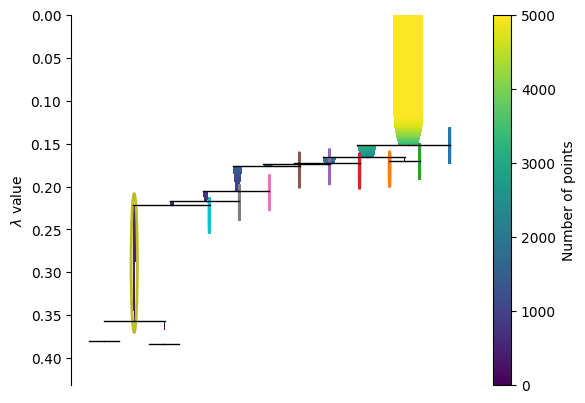

In [39]:
# tree plot
import seaborn as sns
clusterer.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette())

## tuning(noise, cluster)



In [ ]:
# cosine距離の分布:

fig = px.histogram(dist_matrix.flatten(), nbins=100, title="cosine距離の分布")
fig.show()

In [63]:
# cosine
import hdbscan
import numpy as np
import pandas as pd
from itertools import product
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# パラメータ候補
param_grid = {
    "min_cluster_size": [3, 5, 15, 50],
    "min_samples": [1, 3, 5, 10],
    "cluster_selection_epsilon": [0.0, 0.05, 0.1],
    "cluster_selection_method": ["eom", "leaf"],
   
}
from sklearn.metrics.pairwise import cosine_similarity
dist_matrix = cosine_similarity(X)
print(dist_matrix.shape)
results = []

# グリッド探索
keys, values = zip(*param_grid.items())
for vals in product(*values):
    cfg = dict(zip(keys, vals))

    clusterer = hdbscan.HDBSCAN(
        **cfg,
        core_dist_n_jobs=4,  # 並列処理
        metric="precomputed"
    )
    labels = clusterer.fit_predict(dist_matrix)

    noise_ratio = np.mean(labels == -1)
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

    # 評価指標（ラベルがある場合のみ）
    if y is not None:
        ari = adjusted_rand_score(y, labels)
        nmi = normalized_mutual_info_score(y, labels)
    else:
        ari, nmi = np.nan, np.nan

    results.append({
        **cfg,
        "noise_ratio": noise_ratio,
        "n_clusters": n_clusters,
        "ari": ari,
        "nmi": nmi
    })

# 結果を表にまとめる
df_results = pd.DataFrame(results)
df_results = df_results.sort_values(by=["noise_ratio", "ari"], ascending=[True, False])
df_results.reset_index(drop=True, inplace=True)




(5000, 5000)


In [65]:
import IPython 
import pandas as pd

pd.set_option('display.max_rows', 900)

IPython.display.display(df_results)

,min_cluster_size,min_samples,cluster_selection_epsilon,cluster_selection_method,noise_ratio,n_clusters,ari,nmi
0,3,1,0.05,eom,0.9922,2,0.000011,0.002621
1,3,1,0.05,leaf,0.9922,2,0.000011,0.002621
2,3,1,0.10,eom,0.9922,2,0.000011,0.002621
3,3,1,0.10,leaf,0.9922,2,0.000011,0.002621
4,5,1,0.05,eom,0.9922,2,0.000011,0.002621
5,5,1,0.05,leaf,0.9922,2,0.000011,0.002621
6,5,1,0.10,eom,0.9922,2,0.000011,0.002621
7,5,1,0.10,leaf,0.9922,2,0.000011,0.002621
8,3,3,0.00,eom,0.9938,2,0.000007,0.003517
9,3,3,0.05,eom,0.9938,2,0.000007,0.003517


## text

In [39]:
X, y = load_w2v(5000)

/Users/owner/work/DRZoom/src/experiments/15_humap
/Users/owner/work/DRZoom/src/experiments/utils-notebook
Number of words in the model: 3000000
shape of vector: (5000, 300)


In [43]:
# 次元削減しておく
from sklearn.decomposition import PCA
X_reduced = PCA(n_components=15, random_state=0).fit_transform(X)

4233
57


<Axes: ylabel='$\\lambda$ value'>

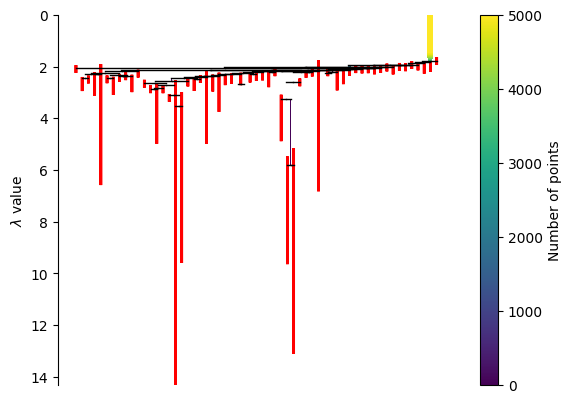

In [15]:
import hdbscan
from sklearn.metrics.pairwise import cosine_similarity
dist_matrix = 1 - cosine_similarity(X)
dist_matrix = dist_matrix.astype(np.float64)
clusterer = hdbscan.HDBSCAN(min_cluster_size=5, 
                            min_samples=5, 
                            metric="precomputed",
                            alpha=1.0,
                            ) #
clusterer.fit(dist_matrix)
labels = clusterer.labels_

# noise点の数
print((clusterer.labels_ == -1).sum())
# cluster数
print(len(set(clusterer.labels_)) - (1 if -1 in clusterer.labels_ else 0))

# tree plot
import seaborn as sns
clusterer.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette())


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 noise ratio: 4161/5000 = 0.832
102


<Axes: ylabel='$\\lambda$ value'>

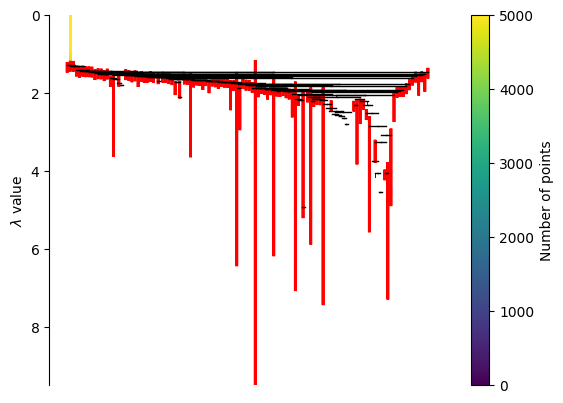

In [44]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=3,
                            min_samples=3, 
                            gen_min_span_tree=True, 
                            metric="euclidean",
                            alpha=1.0) 
clusterer.fit(X_reduced)
labels = clusterer.labels_
# noise点の数 / all点数
print(f" noise ratio: {(clusterer.labels_ == -1).sum()}/{len(clusterer.labels_)} = {(clusterer.labels_ == -1).mean():.3f}")
# cluster数
print(len(set(clusterer.labels_)) - (1 if -1 in clusterer.labels_ else 0))
# tree plot
import seaborn as sns
clusterer.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette())





### Dash app

In [3]:
X, words = load_w2v(5000)

/Users/owner/work/DRZoom/src/experiments/15_humap
/Users/owner/work/DRZoom/src/experiments/utils-notebook
Number of words in the model: 3000000
shape of vector: (5000, 300)


In [125]:
import hdbscan
# ===== HDBSCAN =====
clusterer = hdbscan.HDBSCAN(min_cluster_size=3, 
                            min_samples=3, 
                            metric="euclidean",
                            alpha=1.0,
                            ) #
cluster_labels = clusterer.fit_predict(X)

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [126]:
print(len(clusterer.condensed_tree_._raw_tree))

5166


In [23]:
tree = clusterer.condensed_tree_.to_pandas()
print(tree.head(10))

   parent  child  lambda_val  child_size
0    5000   3957    0.128769           1
1    5000   2714    0.137012           1
2    5000   1294    0.150396           1
3    5000   1805    0.154146           1
4    5000   4110    0.171575           1
5    5000   4504    0.176205           1
6    5000   4260    0.191484           1
7    5000   4229    0.200756           1
8    5000    833    0.202569           1
9    5000    149    0.204700           1


In [28]:
import pandas as pd

tree= clusterer.condensed_tree_.to_pandas() #を想定

# 1. parent→childの辞書を作成
from collections import defaultdict
child_dict = defaultdict(list)
for _, row in tree.iterrows():
    child_dict[row['parent']].append(row['child'])

# 2. 横軸座標を保持する dict
x_dict = {}

# 3. 再帰関数で leaf から順に横軸番号を割り当て
def assign_x(node_id, current_x=[0]):
    children = child_dict.get(node_id, [])
    if not children:  # leaf
        x_dict[node_id] = current_x[0]
        current_x[0] += 1
    else:
        for child in children:
            assign_x(child, current_x)
        # 親は子の中間位置に置く
        child_xs = [x_dict[c] for c in children]
        x_dict[node_id] = sum(child_xs) / len(child_xs)

# 4. rootクラスタから開始（rootは parent だけど child に出てこないID）
all_parents = set(tree['parent'])
all_children = set(tree['child'])
roots = list(all_parents - all_children)

for root in roots:
    assign_x(root)

# 5. treeに新しい列として追加
tree['parent'] = tree['parent'].map(x_dict)
tree['child']  = tree['child'].map(x_dict)
print(tree.head(10))

       parent  child  lambda_val  child_size
0  439.090096    0.0    0.128769           1
1  439.090096    1.0    0.137012           1
2  439.090096    2.0    0.150396           1
3  439.090096    3.0    0.154146           1
4  439.090096    4.0    0.171575           1
5  439.090096    5.0    0.176205           1
6  439.090096    6.0    0.191484           1
7  439.090096    7.0    0.200756           1
8  439.090096    8.0    0.202569           1
9  439.090096    9.0    0.204700           1


In [25]:
# child sizeでソート
tree = tree.sort_values(by="parent", ascending=False).reset_index(drop=True)
print(tree.head())

   parent  child  lambda_val  child_size
0    5034    234    1.007062           1
1    5034    165    0.812450           1
2    5034    528    0.890325           1
3    5034    200    0.898790           1
4    5034    293    1.007062           1


In [8]:
# 親は何個あるか
i = 5000
print(tree[tree["child"] == 10])

      parent  child  lambda_val  child_size
4663    5017     10    0.510434           1


In [ ]:
# condensed tree を pandas.DataFrame で取得
# tree = clusterer.condensed_tree_.to_pandas()
# tree = tree.sort_values(by=["lambda_val"], ascending=False).reset_index(drop=True)

# tree["lambda_val"] = - tree["lambda_val"]  # lambdaは負の値で格納されているので正にする
# lambdaが一定値以下の枝を削除
# tree = tree[tree['lambda_val'] >= 0.3]
fig = go.Figure()
for index, row in tree.iterrows():
    parent = row['parent']
    child = row['child']
    lam = row['lambda_val']
    
    
    # childがparentの点があるか確認
    if row["child_size"] == 1:
        
        lam_fin = 0.0
    else:
        # 最もlambdaの小さい子を探す
        lam_fin = tree[tree['parent'] == child]['lambda_val'].min()
    

    # 横軸は parent, child のIDをそのまま使う（本当はレイアウト工夫必要）
    xs = [parent, child, child]
    ys = [lam, lam, lam_fin ]  # 下から λ の高さまで伸ばすイメージ
    # if index % 100 == 0:
    #     print(xs, ys)
    

    fig.add_trace(go.Scatter(
        x=xs,
        y=ys,
        mode='lines',
        line=dict(color="black", width=0.5),
        hoverinfo="text",
        text=[f"parent={parent}, child={child}, λ={lam:.2f}"]*4
    ))

fig.update_layout(
    title="HDBSCAN Condensed Tree (dendrogram style)",
    xaxis=dict(title="Cluster ID (index)"),
    yaxis=dict(title="Lambda (density threshold)")
)

fig.show()

<Axes: ylabel='$\\lambda$ value'>

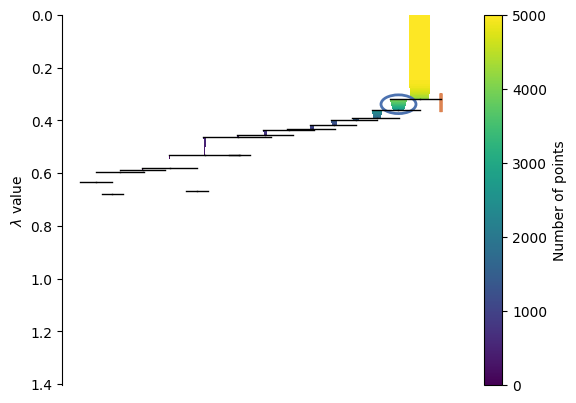

In [32]:
import seaborn as sns
clusterer.condensed_tree_.plot(select_clusters=True,
                               selection_palette=sns.color_palette('deep', 8))

In [ ]:
import dash
from dash import dcc, html, Input, Output
import plotly.graph_objects as go
import numpy as np
import hdbscan
from sklearn.datasets import load_iris
from sklearn.preprocessing import normalize





# condensed treeから階層情報を取得
tree = clusterer.condensed_tree_.to_pandas()

# ===== デンドログラム的な可視化 =====
fig = go.Figure()

for _, row in tree.iterrows():
    # λ値とクラスタIDをplot
    fig.add_trace(go.Scatter(
        x=[row['lambda_val'], row['lambda_val']],
        y=[row['parent'], row['child']],
        mode='lines',
        line=dict(color='black'),
        hoverinfo="text",
        text=[f"Cluster {row['child']} (λ={row['lambda_val']:.2f})"]*2
    ))

fig.update_layout(
    title="HDBSCAN Condensed Tree (Dendrogram-like)",
    width=800,
    height=800,
    xaxis=dict(title="Lambda"),
    yaxis=dict(title="Cluster ID"),
)

# ===== Dash アプリ =====
app = dash.Dash(__name__)

app.layout = html.Div([
    html.H1("HDBSCAN Cluster Explorer"),
    dcc.Graph(id="dendrogram", figure=fig),
    html.Div(id="cluster-info")
])

@app.callback(
    Output("cluster-info", "children"),
    Input("dendrogram", "clickData")
)
def display_cluster_info(clickData):
    if not clickData:
        return "クラスタをクリックしてください"

    # クリックされたクラスタIDを取得
    hover_text = clickData["points"][0]["text"]
    cluster_id = int(hover_text.split()[1])

    # クラスタに属する点
    members = np.where(cluster_labels == cluster_id)[0]
    size = len(members)

    if size == 0:
        return f"Cluster {cluster_id}: No members (noise or pruned)"

    # 中心的な点（重心に最も近いword）
    cluster_vecs = X[members]
    centroid = cluster_vecs.mean(axis=0)
    dists = np.linalg.norm(cluster_vecs - centroid, axis=1)
    center_word = words[members[dists.argmin()]]

    # スコア分布
    scores = clusterer.probabilities_[members]
    score_summary = f"min={scores.min():.2f}, max={scores.max():.2f}, mean={scores.mean():.2f}"

    # クラスタ内の単語（先頭10個）
    sample_words = [words[i] for i in members[:10]]

    return html.Div([
        html.H3(f"Cluster {cluster_id}"),
        html.P(f"Size: {size}"),
        html.P(f"Center word: {center_word}"),
        html.P(f"Score distribution: {score_summary}"),
        html.P(f"Words (sample): {', '.join(sample_words)}"),
    ])


app.run(debug=True)


### describe cluster

In [9]:
tree = clusterer.condensed_tree_.to_pandas()

In [33]:
print(len(tree))

5034


In [38]:
# tree　内のchild, parent, の最大最小
print(f"child: min={tree['child'].min()}, max={tree['child'].max()}")
print(f"parent: min={tree['parent'].min()}, max={tree['parent'].max()}")

child: min=0, max=5034
parent: min=5000, max=5034


In [54]:
import numpy as np
import pandas as pd
import hdbscan

# X: n_samples x n_features のデータ
# clusterer はすでに fit 済み
n_samples = X.shape[0]
tree = clusterer.condensed_tree_
raw_tree = tree._raw_tree  # structured array

# clusterer.outlier_scores_ は n_samples 長さ
outlier_scores = clusterer.outlier_scores_

# Cluster を説明する関数
def describe_cluster(cluster_id, words, raw_tree):
    """
    cluster_id は condensed_tree の child >= n_samples の内部クラスタID
    """
    # cluster_id を parent に持つ全 child を取得
    members_rows = raw_tree[raw_tree['parent'] == cluster_id]
    
    # 元データのインデックス（child < n_samples）
    member_indices = []
    for row in members_rows:
        if row['child'] < n_samples:
            member_indices.append(row['child'])
        else:
            # 下位クラスタも含める場合は再帰的に追加
            member_indices.extend(describe_cluster(row['child'], words, raw_tree)['member_indices'])

    n_labels = 10
    member_indices = np.array(member_indices)
    # member_indicesをクラスタ内のスコアでソート
    member_scores = outlier_scores[member_indices]
    sorted_idx = np.argsort(-member_scores)  # 降順
    member_indices = member_indices[sorted_idx]
    member_words = [words[i] for i in member_indices]

    # クラスタサイズ
    size = len(member_indices)
    
    # 中心的な点(最もクラスタに属している点)
    if size > 0:
        center_idx = member_indices[0]
        center = X[center_idx]
        center_word = words[center_idx]
    else:
        center = None
        center_word = None

    # スコア分布
    scores = outlier_scores[member_indices]
    
    # λ 範囲
    lambda_vals = members_rows['lambda_val']
    lambda_range = (lambda_vals.min(), lambda_vals.max()) if len(lambda_vals) > 0 else (np.nan, np.nan)
    
    # 下位クラスタ番号
    sub_clusters = [row['child'] for row in members_rows if row['child'] >= n_samples]
    
    return {
        "cluster_id": cluster_id,
        "size": size,
        "center": center,
        "center_word": center_word,
        "scores": scores,
        "lambda_range": lambda_range,
        "sub_clusters": sub_clusters,
        "member_words": member_words,
        "member_indices": member_indices

    }

# 例: cluster_id = 5000 のクラスタを確認
for cid in range(n_samples, n_samples + 30):
    print(f"\n--- Cluster ID: {cid} ---")
    cluster_info = describe_cluster(cid, words, raw_tree)
    print("Cluster ID:", cluster_info["cluster_id"])
    print("Size:", cluster_info["size"])
    print("Lambda range:", cluster_info["lambda_range"])
    print("Sub clusters:", cluster_info["sub_clusters"])
    print("Member indices:", cluster_info["member_words"][:10])  # 先頭10個
    print("Center word:", cluster_info["center_word"])
    print("Score summary:", pd.Series(cluster_info["scores"]).describe())



--- Cluster ID: 5000 ---
Cluster ID: 5000
Size: 5000
Lambda range: (0.12876902918172883, 0.31707026664563076)
Sub clusters: [5001, 5002]
Member indices: ['differ_materially', 'AP_Photo', 'looking_statements', 'Writer', 'Tickets', 'please_visit', '#:##.##', 'two', 'W.', '#.##_ERA']
Center word: differ_materially
Score summary: count    5000.000000
mean        0.051873
std         0.048742
min         0.000000
25%         0.016806
50%         0.041095
75%         0.073576
max         0.593879
dtype: float64

--- Cluster ID: 5001 ---
Cluster ID: 5001
Size: 4124
Lambda range: (0.31710615402708114, 0.36019829584883983)
Sub clusters: [5003, 5004]
Member indices: ['two', 'W.', 'S.', 'E.', '##', 'Larry', 'Phil', 'Aaron', 'Frank', 'Ryan']
Center word: two
Score summary: count    4124.000000
mean        0.045911
std         0.037590
min         0.000000
25%         0.015444
50%         0.038844
75%         0.068809
max         0.391593
dtype: float64

--- Cluster ID: 5002 ---
Cluster ID: 5002
S

### 類似度の定義と次元削減

In [88]:
tree = clusterer.condensed_tree_.to_pandas()

In [129]:
tree = clusterer.condensed_tree_
raw_tree = tree._raw_tree
print(aggrigate_clusters(5000, raw_tree, X), len(aggrigate_clusters(5000, raw_tree, X)))

[3957, 2714, 1294, 1805, 4110, 4504, 4260, 4229, 149, 4219, 833, 4169, 4213, 1376, 4659, 2920, 3012, 4488, 3645, 4287, 4263, 3851, 2811, 4842, 3334, 3795, 4168, 3322, 3821, 4963, 3247, 3993, 2278, 4404, 4818, 3959, 3356, 3748, 1663, 3940, 4962, 4788, 4333, 3789, 3787, 3317, 2864, 2582, 3392, 4116, 2664, 2001, 4362, 3761, 4242, 3802, 4538, 4440, 3052, 4299, 2711, 4137, 4498, 3593, 3816, 2104, 3309, 3975, 4109, 4649, 1542, 4827, 3580, 2762, 4321, 3533, 4749, 3889, 4339, 3523, 1208, 3298, 4127, 3992, 3583, 4409, 4405, 3671, 3123, 4028, 4851, 1261, 4973, 4600, 4395, 4670, 4667, 4871, 3575, 4281, 3357, 4438, 4008, 4267, 4567, 3555, 4903, 4605, 4682, 4099, 3688, 1919, 4499, 1566, 3797, 777, 1812, 4153, 3421, 3106, 4874, 3004, 1746, 3727, 4756, 2730, 2498, 2257, 3180, 3712, 3494, 2851, 3779, 3300, 3921, 3654, 4648, 3941, 4628, 3561, 3696, 2781, 4776, 4737, 3140, 4056, 4569, 4324, 4196, 3648, 3240, 4949, 3385, 3467, 4692, 3341, 2272, 4593, 2101, 4782, 3849, 3770, 3422, 3627, 1751, 2142, 3596, 

In [199]:
# 類似度1. メンバーの重心ベクトル
# lambda -> cluster list, size, center, similarity1(matrix), similarity2, ...

# 再帰的にメンバーを集める(child_sizeが1になるまで)
def aggrigate_clusters(cluster_id, raw_tree, X):
    n_samples = X.shape[0]
    members = []
    members_rows = raw_tree[raw_tree['parent'] == cluster_id]
    
    for row in members_rows:
        if row['child'] < n_samples:
            members.append(row['child'])
        else:
            # 下位クラスタも含める場合は再帰的に追加
            members.extend(aggrigate_clusters(row['child'], raw_tree, X))
    return members

import pandas as pd

def cluster_distance_path(cluster_a, cluster_b, tree_df, 
                          mode="hop", 
                          alpha=1.0, beta=0.0, gamma=0.0,
                          verbose=False):
    """
    2つのクラスタ間の距離を計算（LCAを利用）

    Parameters
    ----------
    cluster_a, cluster_b : int
        クラスタID
    tree_df : pd.DataFrame
        condensed_tree を pandas DataFrame 化したもの
        必須列: ['parent', 'child', 'lambda_val', 'child_size']
    mode : str
        'hop'   = hop数 (最短パス長)
        'lambda'= λの合計差
        'mixed' = hop + λ + サイズ の混合
    alpha, beta, gamma : float
        各成分の重み
    """

    # 子から親へ辿る辞書を作成（structured array対応）
    parent_map = {row['child']: row['parent'] for row in tree_df}
    lambda_map = {row['child']: row['lambda_val'] for row in tree_df}
    size_map   = {row['child']: row['child_size'] for row in tree_df}

    # ルートまでのパスをたどる関数
    def path_to_root(c):
        path = []
        lam_sum, size_sum = 0.0, 0.0
        hop = 0
        while c in parent_map:
            p = parent_map[c]
            lam_sum += lambda_map[c]
            if size_map[c] > 0:
                size_sum += 1.0 / size_map[c]
            hop += 1
            path.append((c, p, hop, lam_sum, size_sum))
            c = p
        return path

    path_a = path_to_root(cluster_a)
    path_b = path_to_root(cluster_b)

    # 祖先の集合
    ancestors_a = {p for _, p, *_ in path_a}
    ancestors_b = {p for _, p, *_ in path_b}
    common = ancestors_a.intersection(ancestors_b)
    if not common:
        raise ValueError("No common ancestor found (tree not connected?)")

    # 最小共通祖先 (LCA) を探す
    lca = None
    for _, p, *_ in path_a:
        if p in common:
            lca = p
            break

    # LCAまでの距離を求める
    hop_a = next(h for c, p, h, _, _ in path_a if p == lca)
    hop_b = next(h for c, p, h, _, _ in path_b if p == lca)

    lam_a = next(l for c, p, _, l, _ in path_a if p == lca)
    lam_b = next(l for c, p, _, l, _ in path_b if p == lca)

    size_a = next(s for c, p, _, _, s in path_a if p == lca)
    size_b = next(s for c, p, _, _, s in path_b if p == lca)

    # 距離の定義
    hop_dist = hop_a + hop_b
    lambda_dist = abs(lam_a - lam_b)
    size_dist = abs(size_a - size_b)

    if mode == "hop":
        dist = hop_dist
    elif mode == "lambda":
        dist = lambda_dist
    elif mode == "mixed":
        dist = alpha * hop_dist + beta * lambda_dist + gamma * size_dist
    else:
        raise ValueError(f"Unknown mode: {mode}")

    if verbose:
        print(f"cluster_a={cluster_a}, cluster_b={cluster_b}, LCA={lca}")
        print(f" hop距離={hop_dist}, λ差={lambda_dist:.3f}, サイズ差={size_dist:.3f}")
        print(f"Distance ({mode}) = {dist:.3f}")

    return dist
# 単純なhop数での距離計算例
# cluster_distance_path(5000, 5001, tree, mode="hop", verbose=True)
def cluster_distance_path_matrix(cluster_ids, tree_df, mode="hop", alpha=1.0, beta=0.0, gamma=0.0):
    n = len(cluster_ids)
    dist_matrix = np.zeros((n, n))
    for i in range(n):
        for j in range(i+1, n):
            dist = cluster_distance_path(cluster_ids[i], cluster_ids[j], tree_df, mode=mode, alpha=alpha, beta=beta, gamma=gamma)
            dist_matrix[i, j] = dist
            dist_matrix[j, i] = dist
    return dist_matrix

def build_transition_probabilities(lam, X, tree):
    n_samples = X.shape[0]

    # lambda threshold 以上のクラスタを抽出
    cluster_tree = raw_tree[raw_tree["child"] >= n_samples]
    valid_clusters = cluster_tree[cluster_tree['lambda_val'] <= lam]  # lambda_val は負値で格納されることが多いので注意
    
    # uniqueなクラスタchild ID
    cluster_ids = np.unique(valid_clusters['child'])
    print(f"λ<={lam} のクラスタ数: {len(cluster_ids)}")

    # 各クラスタのメンバー点を集める
    cluster_members = {}
    for cid in cluster_ids:
        # print(f"集計中: クラスタ {cid}")
        members = aggrigate_clusters(cid, raw_tree, X) 
        if members:
            cluster_members[cid] = members
    print(f"メンバーを持つクラスタ数: {len(cluster_members)}")

    # 類似度1: メンバーの重心ベクトルの距離
    cluster_centers = {}
    for cid, members in cluster_members.items():
        vecs = X[members]
        center = vecs.mean(axis=0)
        cluster_centers[cid] = center
    from sklearn.metrics.pairwise import euclidean_distances
    similarity_matrix1 = euclidean_distances(list(cluster_centers.values()))  # 距離行列
    
    # 類似度2: 階層上のパスの長さ
    similarity_matrix2 = _ # cluster_distance_path_matrix(cluster_ids, raw_tree, mode="hop", alpha=1.0, beta=0.0, gamma=0.0)

    # 類似度3: クラスタ代表点間の距離(euclidean)
    from sklearn.metrics.pairwise import euclidean_distances



    # shape check
    print("similarity1 shape:", similarity_matrix1.shape)
    # print("similarity2 shape:", similarity_matrix2.shape)
    # infは大きすぎるので適当に置換(matrix2)
    
    # cluster sizes
    cluster_sizes = {cid: len(members) for cid, members in cluster_members.items()}
    cluster_centers_X = np.array(list(cluster_centers.values()))

    return cluster_ids, cluster_members, cluster_centers_X, similarity_matrix1, similarity_matrix2, cluster_sizes

In [ ]:
import pandas as pd
def test_cluster_distance():    
    # 疑似的な小さな condensed tree
    # parent=1000 が root クラスタ
    # 1001,1002 がその子
    # 1003,1004 はさらに子
    test_tree = pd.DataFrame({
        "parent":   [1000, 1000, 1001, 1001, 1002],
        "child":    [1001, 1002, 1003, 1004, 1005],
        "lambda_val": [1.0, 1.2, 2.0, 2.5, 3.0],
        "child_size": [50, 60, 10, 15, 20]
    })

    print(test_tree)
    # 距離行列を構成する
    n_clusters = test_tree['child'].nunique()
    cluster_ids = test_tree['child'].unique()
    dist_matrix = np.zeros((n_clusters, n_clusters))
    id_to_idx = {cid: idx for idx, cid in enumerate(cluster_ids)}
    for i, cid_a in enumerate(cluster_ids):
        for j, cid_b in enumerate(cluster_ids):
            if i >= j:
                continue
            dist = cluster_distance_path(cid_a, cid_b, test_tree, mode="mixed", alpha=1.0, beta=0.5, gamma=0.1, verbose=True)
            dist_matrix[i, j] = dist
            dist_matrix[j, i] = dist  # 対称行列
    print("Distance matrix:\n", dist_matrix)


In [191]:
cluster_ids, cluster_members, c_X, sim1, sim2, cluster_sizes = build_transition_probabilities(0.5, X, raw_tree)
print(sim2)
print(cluster_sizes)

λ<=0.5 のクラスタ数: 128
メンバーを持つクラスタ数: 128
similarity1 shape: (128, 128)
similarity2 shape: (128, 128)
[[ 0.  2.  3. ... 63. 64. 64.]
 [ 2.  0.  3. ... 63. 64. 64.]
 [ 3.  3.  0. ... 62. 63. 63.]
 ...
 [63. 63. 62. ...  0.  3.  3.]
 [64. 64. 63. ...  3.  0.  2.]
 [64. 64. 63. ...  3.  2.  0.]]
{5001: 4383, 5002: 14, 5003: 4193, 5004: 5, 5005: 3850, 5006: 4, 5007: 3356, 5008: 5, 5009: 3286, 5010: 9, 5011: 3249, 5012: 5, 5013: 3223, 5014: 3, 5015: 3218, 5016: 5, 5017: 3129, 5018: 8, 5019: 3030, 5020: 4, 5021: 2704, 5022: 4, 5023: 2606, 5024: 4, 5025: 2530, 5026: 3, 5027: 2515, 5028: 3, 5029: 2507, 5030: 4, 5031: 2495, 5032: 3, 5033: 2429, 5034: 5, 5035: 2410, 5036: 4, 5037: 2350, 5038: 3, 5039: 2328, 5040: 7, 5041: 2311, 5042: 3, 5043: 2124, 5044: 3, 5045: 2118, 5046: 4, 5047: 1988, 5048: 3, 5049: 1980, 5050: 6, 5051: 1958, 5052: 3, 5053: 1927, 5054: 11, 5055: 1920, 5056: 4, 5057: 1849, 5058: 3, 5059: 1781, 5060: 7, 5061: 1772, 5062: 3, 5063: 1765, 5064: 4, 5065: 1737, 5066: 10, 5067: 1695, 50

In [198]:
def plot(cluster_ids, cluster_members, similarity_matrix, cluster_X, cluster_sizes, title=""):
    reducer = umap.UMAP(n_components=2, 
                        metric="precomputed",
                        random_state=0)
    embedding = reducer.fit_transform(similarity_matrix)

    # scale for cluster_sizes
    cluster_sizes = np.array([cluster_sizes[cid] for cid in cluster_ids])
    cluster_sizes = 5 + (cluster_sizes - cluster_sizes.min()) / (cluster_sizes.max() - cluster_sizes.min()) * 50
    
    plot_scatter_landmark(embedding, cluster_ids, cluster_sizes, title=title)

    # PCA
    reducer = PCA(n_components=2, random_state=0)
    embedding_pca = reducer.fit_transform(cluster_X)
    plot_scatter_landmark(embedding_pca, cluster_ids, cluster_sizes, title=title + " (PCA)")


def plot_scatter_landmark(embedding, cluster_ids, cluster_sizes, title=""):
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(
        x=embedding[:,0],
        y=embedding[:,1],
        mode='markers',
        marker=dict(size=[size for size in cluster_sizes], 
                    color='LightSkyBlue', 
                    line=dict(width=1, 
                              color='DarkSlateGrey'),
                    opacity=0.2),   
    hoverinfo="skip"
    ))
    fig.add_trace(go.Scatter(
        x=embedding[:,0],
        y=embedding[:,1],
        mode='markers+text',
        # text=[f"id:{cid}\nsize:{len(cluster_members[cid])}" for cid in cluster_ids],
        text = [id for id in cluster_ids],
        textfont=dict(size=10, color='black'),
        marker=dict(size=3, 
                    color='black', 
        ),
        hoverinfo="text"
    )
    )
    fig.update_layout(
        title=title,
        width=700,
        height=700,
       
    )
    fig.show()

In [174]:
def plot_distance_relationship(high_dim, embedding):
    n_samples = high_dim.shape[0]
    # ペアワイズ距離
    dist_high = pairwise_distances(high_dim)
    dist_embed = pairwise_distances(embedding)
    print(dist_high.shape, dist_embed.shape)

    # 上三角成分だけ使う
    i_upper = np.triu_indices(n_samples, k=1)
    dist_high_flat = dist_high[i_upper]
    dist_embed_flat = dist_embed[i_upper]

    # ビン分け
    n_bins = 30
    bins = np.linspace(dist_high_flat.min(), dist_high_flat.max(), n_bins+1)
    bin_indices = np.digitize(dist_high_flat, bins) - 1
    bin_centers = 0.5 * (bins[:-1] + bins[1:])  # 各ビンの中心

    # データフレーム作成
    df = pd.DataFrame({
        "high_dim_dist": dist_high_flat,
        "embed_dist": dist_embed_flat,
        "bin": bin_indices
    })
    df = df[df["bin"].between(0, n_bins-1)]
    df["bin_center"] = df["bin"].map(lambda b: bin_centers[b])

    # --- 可視化 ---

    # ヒストグラム (高次元ペアワイズ距離)
    fig_hist = px.histogram(df, x="high_dim_dist", nbins=n_bins,
                            labels={"high_dim_dist":"High-dim pairwise distance", "count":"Number of pairs"},
                            title="Distribution of High-dim pairwise distances")

    # 箱ひげ図 (各ビンごとに埋め込み距離の分布)
    fig_box = px.box(df, x="bin_center", y="embed_dist",
                    labels={"bin_center":"High-dim distance (bin center)", "embed_dist":"Embedding distance"},
                    title="Embedding distances vs. High-dim distance bins")
    
    # Shapard 
    fig_shapard = px.scatter(df, x="high_dim_dist", y="embed_dist",
                            labels={"high_dim_dist":"High-dim pairwise distance", "embed_dist":"Embedding distance"},
                            title="Shapard plot: Embedding vs. High-dim distances",
                            opacity=0.1)
    

    fig_hist.show()
    fig_box.show()
    fig_shapard.show()



In [192]:
# pca
from sklearn.decomposition import PCA
reducer = PCA(n_components=2, random_state=0)
embedding = reducer.fit_transform(c_X)
fig = px.scatter(
    x=embedding[:,0],
    y=embedding[:,1]
)
fig.show()

In [175]:
# ペアワイズ距離の保存
from sklearn.metrics import pairwise_distances

reducer = umap.UMAP(n_components=2, metric="euclidean", random_state=0)
proj = reducer.fit_transform(c_X)
print(c_X.shape, proj.shape)
plot_distance_relationship(c_X, proj)



/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



(128, 300) (128, 2)
(128, 128) (128, 128)


In [157]:
plot(cluster_ids, cluster_members, sim1, cluster_sizes)
plot(cluster_ids, cluster_members, sim2, cluster_sizes)

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [197]:
for lam in [ 0.35, 0.375, 0.4, 0.45, 0.5, 0.55, 0.6, 0.7, 0.8, 0.9]:
    cluster_ids, cluster_members, c_X, sim1, sim2, cluster_sizes = build_transition_probabilities(lam, X, raw_tree)
    
    # print(f"cluster sizes: min={min(cluster_sizes)}, max={max(cluster_sizes)}, mean={np.mean(cluster_sizes):.1f}")
    plot(cluster_ids, cluster_members, sim1, c_X, cluster_sizes, title=f"λ<={lam} のクラスタ (類似度1: 重心ベクトル)")
    # plot(cluster_ids, cluster_members, sim2, cluster_sizes, title=f"λ<={lam} のクラスタ (類似度2: 階層パス長)")

λ<=0.35 のクラスタ数: 6
メンバーを持つクラスタ数: 6
similarity1 shape: (6, 6)
similarity2 shape: (6, 6)
similarity1 shape: (6, 6)
similarity2 shape: (6, 6)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:2462: UserWarning:

n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1



λ<=0.375 のクラスタ数: 22
メンバーを持つクラスタ数: 22
similarity1 shape: (22, 22)
similarity2 shape: (22, 22)
similarity1 shape: (22, 22)
similarity2 shape: (22, 22)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



λ<=0.4 のクラスタ数: 56
メンバーを持つクラスタ数: 56
similarity1 shape: (56, 56)
similarity2 shape: (56, 56)
similarity1 shape: (56, 56)
similarity2 shape: (56, 56)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



λ<=0.45 のクラスタ数: 106
メンバーを持つクラスタ数: 106
メンバーを持つクラスタ数: 106
similarity1 shape: (106, 106)
similarity2 shape: (106, 106)
similarity1 shape: (106, 106)
similarity2 shape: (106, 106)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



λ<=0.5 のクラスタ数: 128
メンバーを持つクラスタ数: 128
メンバーを持つクラスタ数: 128
similarity1 shape: (128, 128)
similarity2 shape: (128, 128)
similarity1 shape: (128, 128)
similarity2 shape: (128, 128)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



λ<=0.55 のクラスタ数: 144
メンバーを持つクラスタ数: 144
similarity1 shape: (144, 144)
similarity2 shape: (144, 144)
similarity1 shape: (144, 144)
similarity2 shape: (144, 144)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



λ<=0.6 のクラスタ数: 152
メンバーを持つクラスタ数: 152
メンバーを持つクラスタ数: 152
similarity1 shape: (152, 152)
similarity2 shape: (152, 152)
similarity1 shape: (152, 152)
similarity2 shape: (152, 152)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



λ<=0.7 のクラスタ数: 164
メンバーを持つクラスタ数: 164
similarity1 shape: (164, 164)
similarity2 shape: (164, 164)
similarity1 shape: (164, 164)
similarity2 shape: (164, 164)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



λ<=0.8 のクラスタ数: 164
メンバーを持つクラスタ数: 164
similarity1 shape: (164, 164)
similarity2 shape: (164, 164)
similarity1 shape: (164, 164)
similarity2 shape: (164, 164)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



λ<=0.9 のクラスタ数: 164
メンバーを持つクラスタ数: 164
similarity1 shape: (164, 164)
similarity2 shape: (164, 164)
similarity1 shape: (164, 164)
similarity2 shape: (164, 164)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning:

using precomputed metric; inverse_transform will be unavailable

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



# 生成したデータで(ガウシアン)

In [34]:
X, y = load_synthetic_gaussian(n_samples=5000, n_features=100, n_clusters=100, cluster_stds=[1.0, 2.0, 3.0, 1.5, 0.6], random_state=42)

Synthetic Gaussian dataset loaded with 5000 samples and 100 features.
Number of clusters: 100
Standard deviation variations: [1.0, 2.0, 3.0, 1.5, 0.6]
Assigned standards: [1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6, 1.0, 2.0, 3.0, 1.5, 0.6]
Samples per cluster: [50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


0
100


<Axes: ylabel='$\\lambda$ value'>

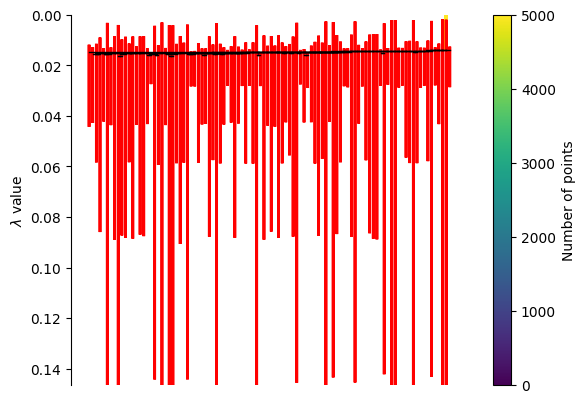

In [35]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=5,
                            min_samples=5, 
                            gen_min_span_tree=True, 
                            metric="euclidean",
                            alpha=1.0) 
clusterer.fit(X)
labels = clusterer.labels_
# noise点の数
print((clusterer.labels_ == -1).sum())
# cluster数
print(len(set(clusterer.labels_)) - (1 if -1 in clusterer.labels_ else 0))
# tree plot
import seaborn as sns
clusterer.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette())


# lambda

In [ ]:
clusterer.labels_ # → 各サンプルの最終クラスタラベル（-1 はノイズ）

clusterer.probabilities_ # → サンプルごとのクラスタへの所属確信度

clusterer.outlier_scores_ # → ノイズ点のスコア

# 階層構造の取得
tree = clusterer.condensed_tree_
df = pd.DataFrame(tree.to_pandas())
print(df.head())



In [35]:
print(vars(tree))

{'_raw_tree': array([(5000, 4909, 0.09881067, 1), (5000, 1448, 0.1048774 , 1),
       (5000, 3370, 0.1058469 , 1), ..., (5024,  871, 0.4101895 , 1),
       (5024,  891, 0.4101895 , 1), (5024,  951, 0.4101895 , 1)],
      dtype=[('parent', '<i8'), ('child', '<i8'), ('lambda_val', '<f8'), ('child_size', '<i8')]), 'cluster_selection_method': 'eom', 'allow_single_cluster': False}


In [42]:






# --- Condensed Tree ---
tree = clusterer.condensed_tree_

# --- 任意の階層（lambda）でクラスタ抽出 ---
# select_clusters: Trueで安定クラスタのみ抽出, 落とされたクラスタを取り出すにはcondensed_tree?._raw_tree
clusters = tree._select_clusters()
print(f'cluster num at selected level: {len(clusters)}')
cluster_info_list = []
    
# clustererから直接情報を取得
labels = clusterer.labels_
probabilities = clusterer.probabilities_

# 各クラスタIDについて情報を収集
unique_labels = np.unique(labels)
unique_labels = unique_labels[unique_labels >= 0]  # ノイズ(-1)を除外

for cl_id in unique_labels:
    # このクラスタに属する点のインデックス
    indices = np.where(labels == cl_id)[0]
    
    # 所属確率
    scores = probabilities[indices]
    
    # condensed treeから安定性情報を取得（可能であれば）
    try:
        # condensed treeのデータフレームから情報を取得
        tree_df = tree.to_pandas()
        cluster_tree_data = tree_df[tree_df['child'] == cl_id]
        
        if len(cluster_tree_data) > 0:
            lambda_min = cluster_tree_data['lambda_val'].min()
            lambda_max = cluster_tree_data['lambda_val'].max()
            stability = lambda_max - lambda_min
        else:
            lambda_min = lambda_max = stability = 0.0
            
    except:
        # fallback
        lambda_min = lambda_max = stability = 0.0

    cluster_info_list.append({
        "cluster_id": cl_id,
        "indices": indices,
        "lambda_min": lambda_min,
        "lambda_max": lambda_max,
        "stability": stability,
        "scores": scores
    })

# 確認
for info in cluster_info_list:
    print(f"Cluster {info['cluster_id']}: size={len(info['indices'])}, stability={info['stability']:.3f}")


cluster num at selected level: 10
Cluster 0: size=25, stability=0.000
Cluster 1: size=92, stability=0.000
Cluster 2: size=10, stability=0.000
Cluster 3: size=60, stability=0.000
Cluster 4: size=31, stability=0.000
Cluster 5: size=30, stability=0.000
Cluster 6: size=18, stability=0.000
Cluster 7: size=15, stability=0.000
Cluster 8: size=530, stability=0.000
Cluster 9: size=61, stability=0.000


In [49]:


# Condensed Tree を DataFrame に変換
df_tree = clusterer.condensed_tree_.to_pandas()

# λ を変化させてクラスタを抽出
lambda_values = np.linspace(0.1, df_tree['lambda_val'].max(), 5)
print("Lambda values for cluster extraction:", np.round(lambda_values, 3))

for _lambda in lambda_values:
    # λ 以上のクラスタを抽出（生データなので非安定クラスタも含む）
    clusters_at_lambda = df_tree[df_tree['lambda_val'] >= _lambda]
    print(f"cluster num at λ={_lambda:.2f}: {len(clusters_at_lambda)}")
    
    print(f"\n--- λ = {_lambda:.2f} ---")
    
    
    for _, row in clusters_at_lambda.iterrows():
       
        cluster_id = row['child']
        cluster_size = row['child_size']
        
        # クラスタに属するサンプルのインデックス
        indices = np.where(clusterer.labels_ == cluster_id)[0]
        
        # 各サンプルの所属スコア
        scores = clusterer.probabilities_[indices]
        
        # クラスタの寿命（lambda_max - lambda_min）
        lambda_max = row['lambda_val']
        lambda_min = row['parent'] if row['parent'] > 0 else 0
        lifetime = lambda_max - lambda_min

        
        # print(f"Cluster {cluster_id}: size={cluster_size}, lifetime={lifetime:.3f}, n_samples={len(indices)}, mean_score={scores.mean():.3f}")

Lambda values for cluster extraction: [0.1   0.178 0.255 0.333 0.41 ]
cluster num at λ=0.10: 5023

--- λ = 0.10 ---
cluster num at λ=0.18: 1677

--- λ = 0.18 ---
cluster num at λ=0.26: 494

--- λ = 0.26 ---
cluster num at λ=0.33: 278

--- λ = 0.33 ---
cluster num at λ=0.41: 10

--- λ = 0.41 ---


In [52]:
dfs = []
for _lambda in lambda_values:
    # λ 以上のクラスタを抽出（生データなので非安定クラスタも含む）
    clusters_at_lambda = df_tree[df_tree['lambda_val'] >= _lambda]
    print(f"cluster num at λ={_lambda:.2f}: {len(clusters_at_lambda)}")
    
    print(f"\n--- λ = {_lambda:.2f} ---")
    
    id_to_indices = {}
    for _, row in clusters_at_lambda.iterrows():
       
        cluster_id = row['child']
        cluster_size = row['child_size']
        
        # クラスタに属するサンプルのインデックス
        indices = np.where(clusterer.labels_ == cluster_id)[0]
        
        # 各サンプルの所属スコア
        scores = clusterer.probabilities_[indices]
        
        # クラスタの寿命（lambda_max - lambda_min）
        lambda_max = row['lambda_val']
        lambda_min = row['parent'] if row['parent'] > 0 else 0
        lifetime = lambda_max - lambda_min
        id_to_indices[cluster_id] = indices
    
    # id_to_indices を使ってラベル配列を作成
    labels = -1 * np.ones(len(X), dtype=int)  # 初期値はノイズ
    for cid, indices in id_to_indices.items():
        labels[indices] = cid

    
    df = pd.DataFrame(proj, columns=['x','y'])  # UMAP 埋め込み座標
    df['cluster'] = labels.astype(str)
    df['lambda'] = f'lambda={_lambda:.3f}'
    dfs.append(df)

df_all = pd.concat(dfs, ignore_index=True)
fig = px.scatter(
    df_all, x='x', y='y',
    color='cluster',
    facet_col='lambda',
    opacity=0.7,
    title=f'UMAP embedding colored by HDBSCAN clusters n={n_samples})'
)
n_facets = len(lambda_values)
fig.update_traces(marker=dict(size=2))
fig.update_layout(
    width=500 * n_facets,   # facet の列数に応じて幅を拡大
    height=500,             # 1行の場合の高さ
)
fig.show()

cluster num at λ=0.10: 5023

--- λ = 0.10 ---
cluster num at λ=0.18: 1677

--- λ = 0.18 ---
cluster num at λ=0.26: 494

--- λ = 0.26 ---
cluster num at λ=0.33: 278

--- λ = 0.33 ---
cluster num at λ=0.41: 10

--- λ = 0.41 ---


# 凝集型クラスタリング

In [ ]:
# 階層型のクラスタリングとデンドログラム
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import plotly.figure_factory as ff



# 凝集型クラスタリング（Ward法）
Z = linkage(X, method='ward')  # Z が階層情報を持つ

# Plotly デンドログラム（Z を使う）
fig = ff.create_dendrogram(X, linkagefun=lambda x: Z)
fig.update_layout(width=1000, height=600, title='Hierarchical Clustering Dendrogram')
fig.show()

# 階層を切る場合（クラスタ数 k）
k = 5
labels = fcluster(Z, k, criterion='maxclust')



In [3]:
import numpy as np
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
import plotly.graph_objects as go



# 凝集型クラスタリング（Ward法）
Z = linkage(X, method='ward')

# デンドログラム情報を取得
dendro = dendrogram(Z, no_plot=True)

# デンドログラムの座標を Plotly 用に変換
icoord = np.array(dendro['icoord'])
dcoord = np.array(dendro['dcoord'])
labels = dendro['leaves']

# Plotly traces 作成
traces = []
for xs, ys in zip(icoord, dcoord):
    traces.append(go.Scatter(x=xs, y=ys, mode='lines', line=dict(color='black')))

# スライダー用にクラスタ色分け
max_height = np.max(dcoord)
n_steps = 10
steps = []

for h in np.linspace(0, max_height, n_steps):
    # fcluster で高さ h でクラスタ分け
    cluster_labels = fcluster(Z, t=h, criterion='distance')
    colors = np.array(cluster_labels)
    
    # traces を更新するためのステップ
    step = dict(
        method="update",
        args=[{"line.color": ["black"] * len(traces)},  # デフォルト黒線
              {"title": f"Hierarchical Clustering Dendrogram - height {h:.2f}"}],
        label=f"{h:.1f}"
    )
    steps.append(step)

# Figure 作成
fig = go.Figure(data=traces)

# スライダー追加
fig.update_layout(
    sliders=[dict(
        active=0,
        currentvalue={"prefix": "Cut Height: "},
        pad={"t": 50},
        steps=steps
    )],
    width=1200,
    height=600,
    title="Hierarchical Clustering Dendrogram with Slider"
)

fig.show()


In [4]:
max_d = 50  # 高さ（距離）の閾値
labels = fcluster(Z, t=max_d, criterion='distance')

# 例2: クラスタ数 k でカットする
k = 10
labels_k = fcluster(Z, t=k, criterion='maxclust')



In [5]:
import plotly.express as px
import pandas as pd

# y_true: 元ラベル（MNIST, Fashion-MNISTなど）
cluster_id = 3  # 調べたいクラスタ番号
cluster_mask = labels_k == cluster_id

df = pd.DataFrame({
    'label': y[cluster_mask]
})

fig = px.pie(df, names='label', title=f'Cluster {cluster_id} Label Distribution')
fig.show()


In [11]:
import numpy as np
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from jupyter_dash import JupyterDash
from dash import dcc, html, Output, Input
import plotly.graph_objects as go
import plotly.express as px  # 色用

# ---- 階層クラスタリング ----
Z = linkage(X, method='ward')

dendro = dendrogram(Z, no_plot=True)
icoord = np.array(dendro['icoord'])
dcoord = np.array(dendro['dcoord'])
labels = dendro['leaves']

# ---- Dashアプリ ----
app = JupyterDash(__name__)
app.layout = html.Div([
    html.H3("Hierarchical Clustering Dendrogram"),
    dcc.Graph(id='dendro-graph'),
    dcc.Slider(
        id='height-slider',
        min=0,
        max=np.max(dcoord),
        step=np.max(dcoord)/50,
        value=np.max(dcoord)/2,
        marks={float(f"{h:.1f}"): f"{h:.1f}" for h in np.linspace(0, np.max(dcoord), 6)},
    ),
])

# ---- コールバック ----
@app.callback(
    Output('dendro-graph', 'figure'),
    Input('height-slider', 'value')
)
def update_dendrogram(h):
    cluster_labels = fcluster(Z, t=h, criterion='distance')
    unique_clusters = np.unique(cluster_labels)
    
    # 色をクラスタ番号に応じて割り当て
    palette = px.colors.qualitative.Dark24
    colors_map = {cl: palette[i % len(palette)] for i, cl in enumerate(unique_clusters)}
    
    # デンドログラム線の色をクラスタ番号で決定（目安）
    line_colors = []
    for xs in icoord:
        idx = int(np.mean([int((x-5)/10) for x in xs]))
        idx = min(max(idx, 0), len(cluster_labels)-1)
        cl = cluster_labels[idx]
        line_colors.append(colors_map[cl])

    traces = [go.Scatter(x=xs, y=ys, mode='lines', line=dict(color=lc)) 
              for xs, ys, lc in zip(icoord, dcoord, line_colors)]

    fig = go.Figure(data=traces)
    fig.update_layout(width=1200, height=600,
                      title=f"Hierarchical Clustering Dendrogram - height {h:.2f}")
    return fig

# ---- 外部ブラウザで起動 ----
app.run(mode='external')


In [12]:
import numpy as np
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from jupyter_dash import JupyterDash
from dash import dcc, html, Input, Output
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd

# ---- データ準備 ----
# X: N x D のデータ行列
# y_true: 元ラベル (MNIST, Fashion-MNISTなど)
n_samples = 5000
X_subset = X[:n_samples]
y_subset = y[:n_samples]

# 階層クラスタリング（Ward法）
Z = linkage(X_subset, method='ward')
dendro = dendrogram(Z, no_plot=True)
icoord, dcoord = np.array(dendro['icoord']), np.array(dendro['dcoord'])

# ---- Dash アプリ ----
app = JupyterDash(__name__)
app.layout = html.Div([
    html.H3("Hierarchical Clustering Dendrogram with Cluster Pie Charts"),
    
    # デンドログラム高さスライダー
    html.Div([
        html.Label("Cut Height"),
        dcc.Slider(
            id='height-slider',
            min=0,
            max=np.max(dcoord),
            step=np.max(dcoord)/50,
            value=np.max(dcoord)/2,
            marks={float(f"{h:.1f}"): f"{h:.1f}" for h in np.linspace(0, np.max(dcoord), 6)},
        ),
    ], style={'width':'70%', 'padding':'20px'}),
    
    # 選択クラスタマルチ選択
    html.Div([
        html.Label("Select Clusters"),
        dcc.Dropdown(id='cluster-dropdown', multi=True)
    ], style={'width':'50%', 'padding':'10px'}),
    
    # デンドログラム
    dcc.Graph(id='dendro-graph'),
    
    # 円グラフ
    html.Div(id='pie-charts', style={'display':'flex', 'flex-wrap':'wrap'})
])

# ---- コールバック ----
@app.callback(
    Output('dendro-graph', 'figure'),
    Output('cluster-dropdown', 'options'),
    Input('height-slider', 'value')
)
def update_dendrogram(h):
    cluster_labels = fcluster(Z, t=h, criterion='distance')
    n_clusters = len(np.unique(cluster_labels))
    
    # デンドログラム traces (黒線)
    traces = [go.Scatter(x=xs, y=ys, mode='lines', line=dict(color='black')) 
              for xs, ys in zip(icoord, dcoord)]
    fig = go.Figure(data=traces)
    fig.update_layout(width=1200, height=600, title=f"Dendrogram - height {h:.2f}")
    
    # ドロップダウンにクラスタ番号を設定
    options = [{'label': str(c), 'value': c} for c in np.unique(cluster_labels)]
    
    return fig, options

@app.callback(
    Output('pie-charts', 'children'),
    Input('cluster-dropdown', 'value'),
    Input('height-slider', 'value')
)
def update_pies(selected_clusters, h):
    if not selected_clusters:
        return []
    
    cluster_labels = fcluster(Z, t=h, criterion='distance')
    children = []
    
    for c in selected_clusters:
        mask = cluster_labels == c
        df = pd.DataFrame({'label': y_subset[mask]})
        fig = px.pie(df, names='label', title=f'Cluster {c}', width=250, height=250)
        children.append(dcc.Graph(figure=fig, style={'margin':'5px'}))
    
    return children

app.run(mode='external')


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/dash/dash.py:634: UserWarning:

JupyterDash is deprecated, use Dash instead.
See https://dash.plotly.com/dash-in-jupyter for more details.



In [15]:
# 選択した階層にいくつクラスタがあるか
"""
max_d = 50  # 高さ（距離）の閾値
labels = fcluster(Z, t=max_d, criterion='distance')

# 例2: クラスタ数 k でカットする
k = 10
labels_k = fcluster(Z, t=k, criterion='maxclust')


"""

for max_d in np.linspace(0, np.max(dcoord), 20):
    labels = fcluster(Z, t=max_d, criterion='distance')
    print(f'Cut at height {max_d} -> clusters={len(set(labels)) - (1 if -1 in labels else 0)}')

Cut at height 0.0 -> clusters=5000
Cut at height 8.348041838308335 -> clusters=1140
Cut at height 16.69608367661667 -> clusters=197
Cut at height 25.044125514925007 -> clusters=80
Cut at height 33.39216735323334 -> clusters=46
Cut at height 41.74020919154167 -> clusters=32
Cut at height 50.088251029850014 -> clusters=24
Cut at height 58.43629286815835 -> clusters=17
Cut at height 66.78433470646668 -> clusters=13
Cut at height 75.13237654477501 -> clusters=10
Cut at height 83.48041838308335 -> clusters=8
Cut at height 91.82846022139168 -> clusters=6
Cut at height 100.17650205970003 -> clusters=6
Cut at height 108.52454389800836 -> clusters=6
Cut at height 116.8725857363167 -> clusters=5
Cut at height 125.22062757462503 -> clusters=5
Cut at height 133.56866941293336 -> clusters=4
Cut at height 141.9167112512417 -> clusters=3
Cut at height 150.26475308955003 -> clusters=3
Cut at height 158.61279492785837 -> clusters=1


In [16]:
reducer = umap.UMAP(n_components=2, random_state=0)
proj = reducer.fit_transform(X)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [19]:
max_d = 
labels = fcluster(Z, t=max_d, criterion='distance')
print(f'Cut at height {max_d} -> clusters={len(set(labels)) - (1 if -1 in labels else 0)}')

df_proj = pd.DataFrame(proj, columns=["x","y"])
# labelsから点にクラスタ番号をつけたい
df_proj["label"] = labels.astype(str)

# labelで色付けしたumap
fig = px.scatter(
        df_proj, x='x', y='y',
        color='label',
        title=f'UMAP embedding colored by hierarchical clusters (cut at {max_d})'
    )
fig.update_traces(marker=dict(size=3))
fig.update_layout(width=600, height=600)
fig.show()


Cut at height 32 -> clusters=50


In [ ]:
"""
# --- Plotly で可視化 ---
    df_all = pd.concat(dfs, ignore_index=True)
    fig = px.scatter(
        df_all, x='x', y='y',
        color='cluster',
        facet_col='eps',
        opacity=0.7,
        title=f'UMAP embedding colored by DBSCAN clusters ({dataset}, n={n_samples})'
    )
    n_facets = len(eps_list)
    fig.update_traces(marker=dict(size=2))
    fig.update_layout(
    width=500 * n_facets,   # facet の列数に応じて幅を拡大
    height=500,             # 1行の場合の高さ
)
    fig.show()

"""
dfs = []
n_split = 10
for max_d in np.linspace(0, np.max(dcoord), n_split):
    labels = fcluster(Z, t=max_d, criterion='distance')
    print(f'Cut at height {max_d} -> clusters={len(set(labels)) - (1 if -1 in labels else 0)}')

    df = pd.DataFrame(proj, columns=["x","y"])
    df["max_d"] = f"max_d={max_d:.2f}"
    df["label"] = labels.astype(str)
    dfs.append(df)

df_all = pd.concat(dfs, ignore_index=True)
fig = px.scatter(
        df_all, x='x', y='y',
        color='label',
        color
        facet_col='max_d',
        # facet_col_wrap=5,
        opacity=0.7,
        title=f'UMAP embedding colored by hierarchical clusters (various cuts)'
    )
n_facets = n_split
fig.update_traces(marker=dict(size=2))
fig.update_layout(
    width=500 * n_facets,   # facet の列数に応じて幅を拡大
    height=500,             # 1行の場合の高さ
)
fig.show()


Cut at height 0.0 -> clusters=5000
Cut at height 17.623643880873153 -> clusters=177
Cut at height 35.24728776174631 -> clusters=40
Cut at height 52.87093164261946 -> clusters=23
Cut at height 70.49457552349261 -> clusters=12
Cut at height 88.11821940436576 -> clusters=7
Cut at height 105.74186328523892 -> clusters=6
Cut at height 123.36550716611208 -> clusters=5
Cut at height 140.98915104698523 -> clusters=3
Cut at height 158.61279492785837 -> clusters=1
